In [4]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [6]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [4]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())  

In [7]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth 
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM
    
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST) 
    return resizedIM

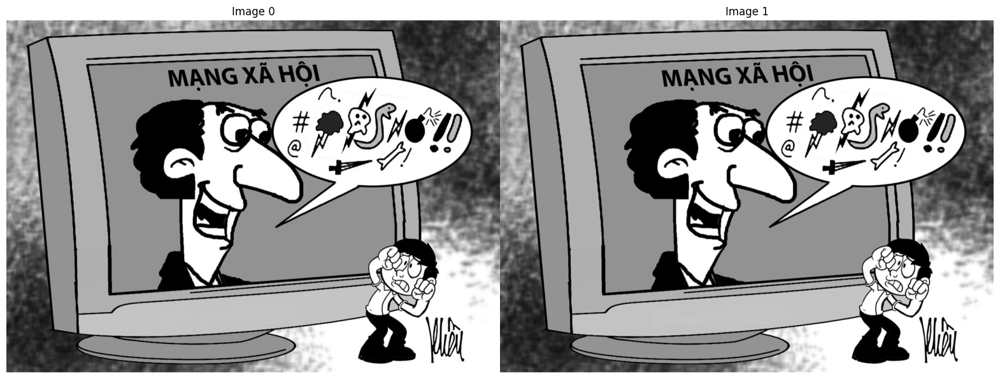

In [6]:
# Read Image 
image_color = imread("img5867-15970678969911157002438.webp")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

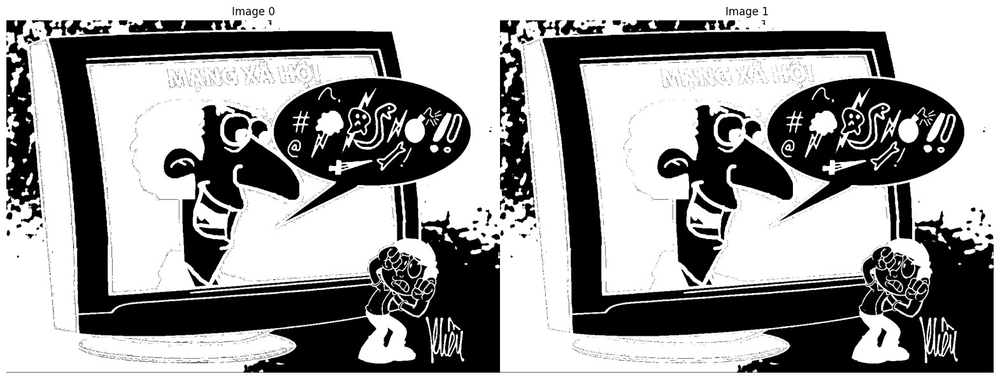

150.0


In [7]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255  # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)

In [8]:
print(image_mask01.min(), image_mask01.max())
print(image_mask02.min(), image_mask02.max())

0 255
0 255


[[1 1 1]
 [1 1 1]
 [1 1 1]]


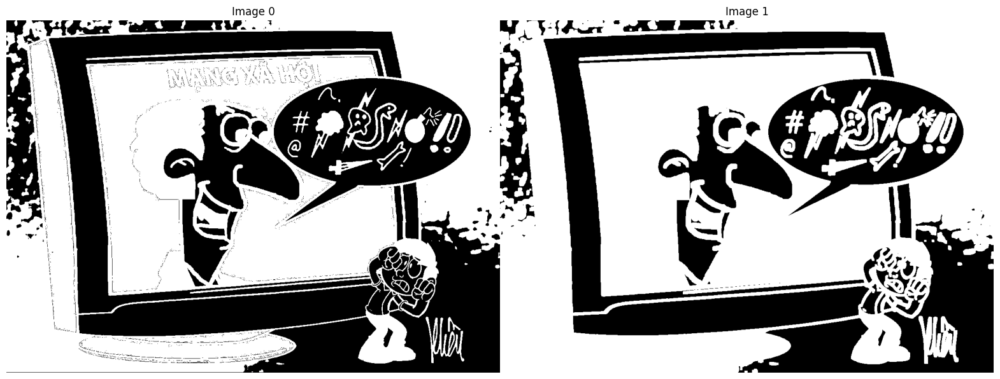

In [9]:
S

In [10]:
result = image_color.copy()

contours, hierarchy = cv2.findContours(image_dilated,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
count = 0
DataDF = pd.DataFrame(columns = ["x", "y", "w", "h"])
for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if(w * h > 300):
        cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),2) 
        DataDF.loc[count,:] = (x,y,w,h)
        count = count + 1
DataDF = DataDF.astype(int)

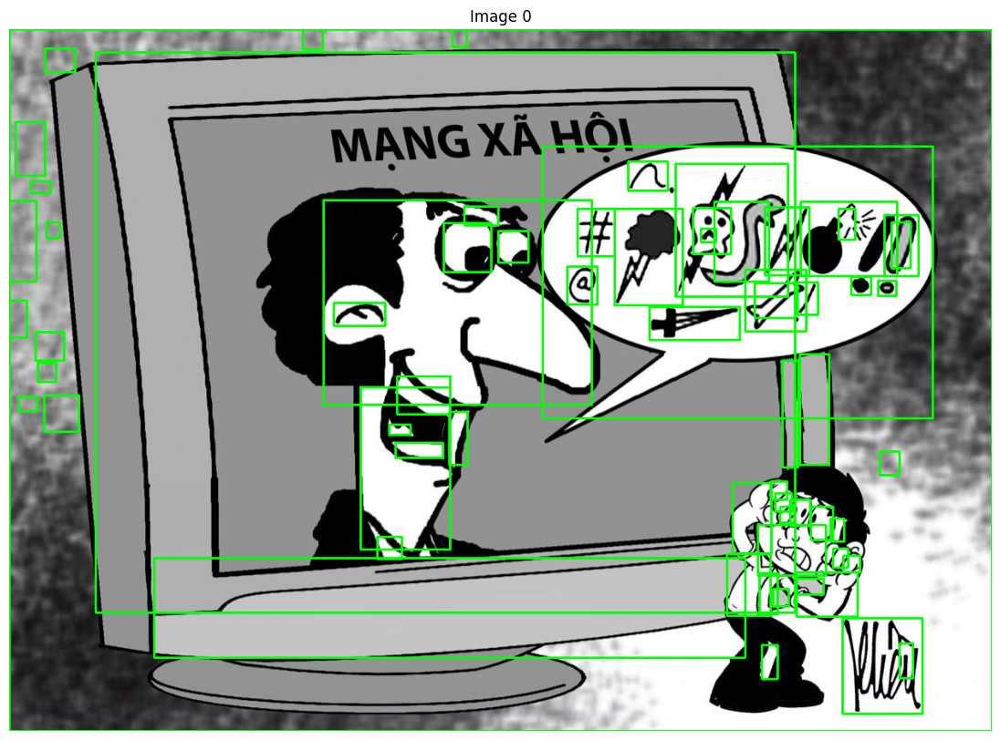

,x,y,w,h
0,1053,745,101,121
1,1125,777,17,44
2,1100,534,25,30
3,36,422,23,24
4,33,383,36,36


In [11]:
ShowImage([result], 1, 1)
display(DataDF.head())

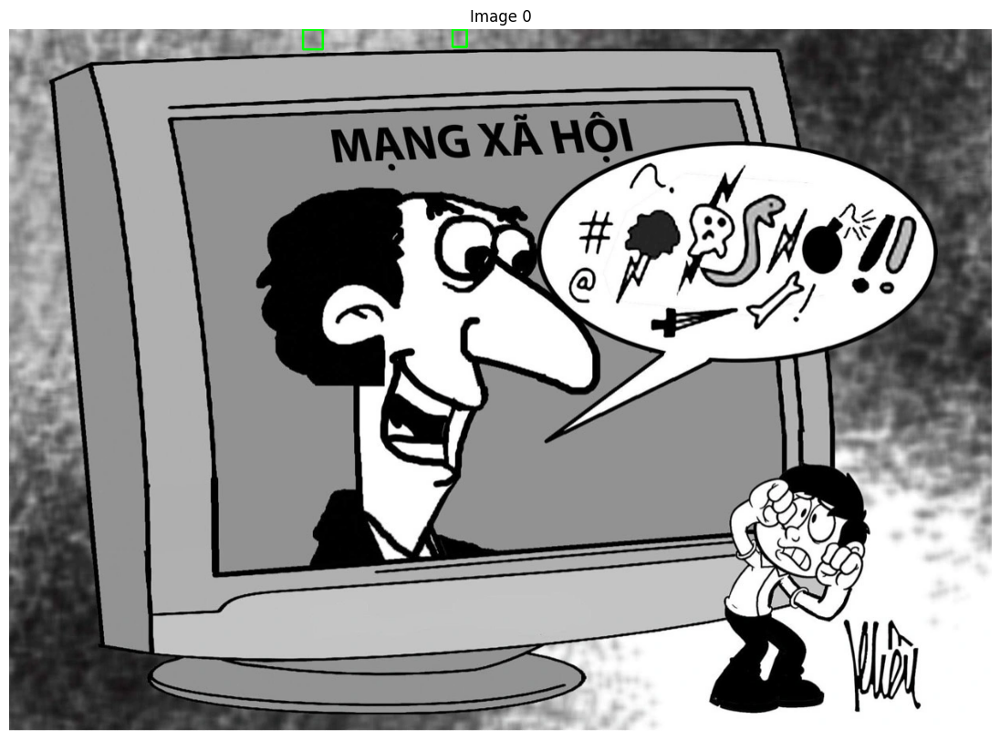

In [12]:
result01 = image_color.copy()
idx = 10
x,y,w,h = DataDF.loc[idx, ["x", "y", "w", "h"]]
cv2.rectangle(result01,(x,y),(x+w,y+h),(0,255,0),2) 

idx = 11
x,y,w,h = DataDF.loc[idx, ["x", "y", "w", "h"]]
cv2.rectangle(result01,(x,y),(x+w,y+h),(0,255,0),2) 

ShowImage([result01], 1, 1)

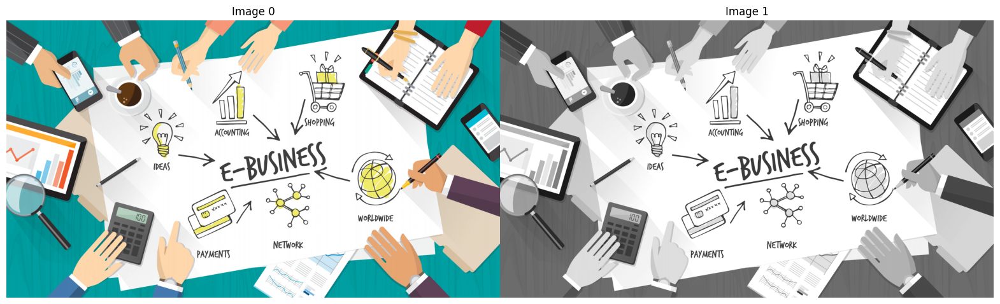

In [13]:
# Read Image 
image_color = imread("98329.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

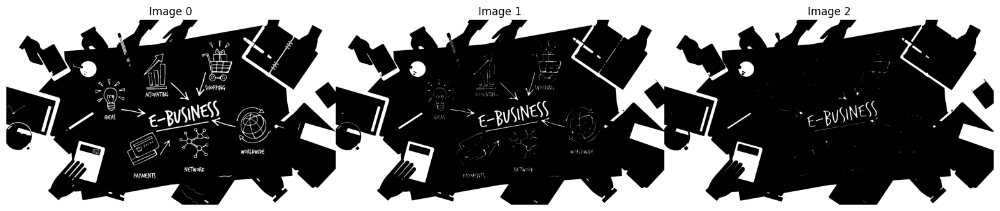

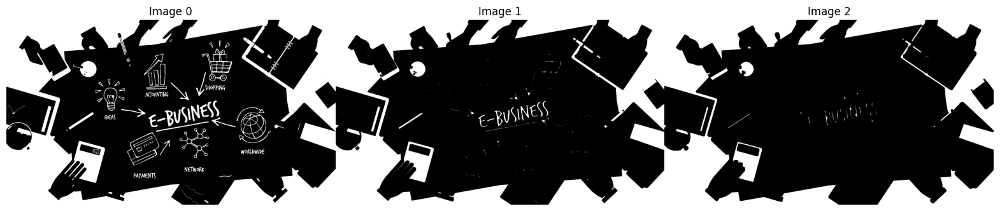

In [14]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

In [15]:
from skimage.measure import label, regionprops

image_mask = image_erosion04.copy()
image_label = label(image_mask) # Label each area in the image from 1 to n
print("index of each region from 1 to ", image_label.max())

index of each region from 1 to  60


In [18]:
import pandas as pd
from skimage import measure

# Assuming 'image_label' is your labeled image and 'image_gray' is your intensity image
regions = measure.regionprops(image_label, intensity_image=image_gray)

ColList = ["label", "at_row", "at_col", 
           "area", "minr", "minc", "maxr", "maxc", "width", "height", 
           "max_intensity", "mean_intensity", "min_intensity"]

LabelDF = pd.DataFrame(columns=ColList)

for region in regions:
    label = region.label
    at_row, at_col = region.centroid
    area = region.area
    minr, minc, maxr, maxc = region.bbox
    width = maxc - minc
    height = maxr - minr
    max_intensity = region.max_intensity
    mean_intensity = region.mean_intensity
    min_intensity = region.min_intensity

    LabelDF = pd.concat([LabelDF, pd.DataFrame({
        "label": [label],
        "at_row": [at_row],
        "at_col": [at_col],
        "area": [area],
        "minr": [minr],
        "minc": [minc],
        "maxr": [maxr],
        "maxc": [maxc],
        "width": [width],
        "height": [height],
        "max_intensity": [max_intensity],
        "mean_intensity": [mean_intensity],
        "min_intensity": [min_intensity],
    })], ignore_index=True)


In [19]:
display(LabelDF.head())

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,1,526.582769,277.446518,273093.0,0,0,1034,972,972,1034,150.0,103.601400,23.0
1,2,67.553323,853.673211,15331.0,0,747,141,979,232,141,117.0,109.837714,88.0
2,3,35.724820,1201.275220,25169.0,0,1005,102,1458,453,102,125.0,109.799714,25.0
3,4,266.680766,1712.738174,90144.0,0,1319,617,1838,519,617,149.0,97.117224,19.0
4,5,79.787524,1408.456140,513.0,37,1380,121,1436,56,84,36.0,31.922027,27.0


In [20]:
LabelDF = LabelDF.sort_values(by = "area", ascending = False)
LabelDF = LabelDF.reset_index(drop = True)
LabelDF.head()

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,1,526.582769,277.446518,273093.0,0,0,1034,972,972,1034,150.0,103.601400,23.0
1,4,266.680766,1712.738174,90144.0,0,1319,617,1838,519,617,149.0,97.117224,19.0
2,60,969.362145,1544.635252,67622.0,838,1190,1034,1838,648,196,120.0,107.240336,63.0
3,3,35.724820,1201.275220,25169.0,0,1005,102,1458,453,102,125.0,109.799714,25.0
4,54,651.353572,1749.421946,16322.0,583,1645,727,1838,193,144,80.0,73.236552,64.0


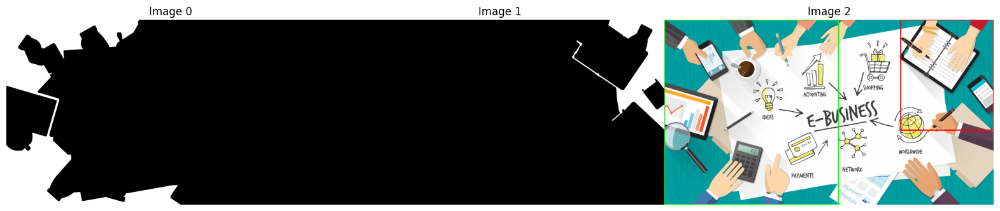

In [21]:
label01 = LabelDF.loc[0, "label"]
label02 = LabelDF.loc[1, "label"]

image_mask_area01 = image_label == label01
image_mask_area02 = image_label == label02

result = image_color.copy()

x = int(LabelDF.loc[0, "minc"])
y = int(LabelDF.loc[0, "minr"])
w = int(LabelDF.loc[0, "width"])
h = int(LabelDF.loc[0, "height"])
cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),5) 


x = int(LabelDF.loc[1, "minc"])
y = int(LabelDF.loc[1, "minr"])
w = int(LabelDF.loc[1, "width"])
h = int(LabelDF.loc[1, "height"])
cv2.rectangle(result,(x,y),(x+w,y+h),(255,0,0),5) 

ShowImage([image_mask_area01, image_mask_area02, result], 1, 3)

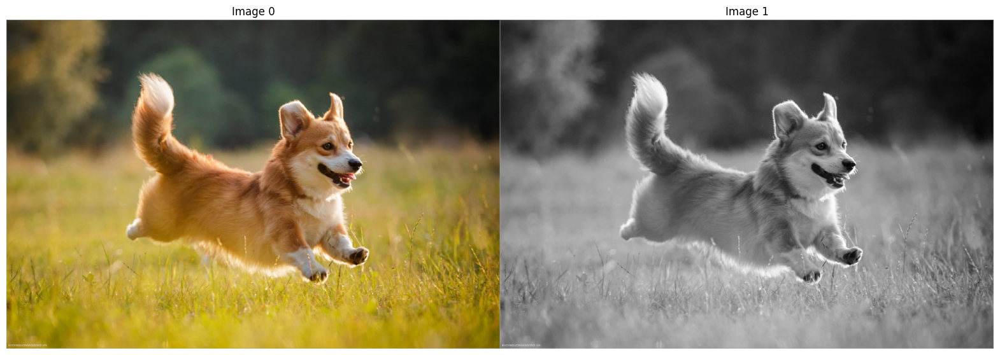

In [23]:
# Read Image 
image_color = imread("hinh-nen-cho-cute-de-thuong-nhat.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

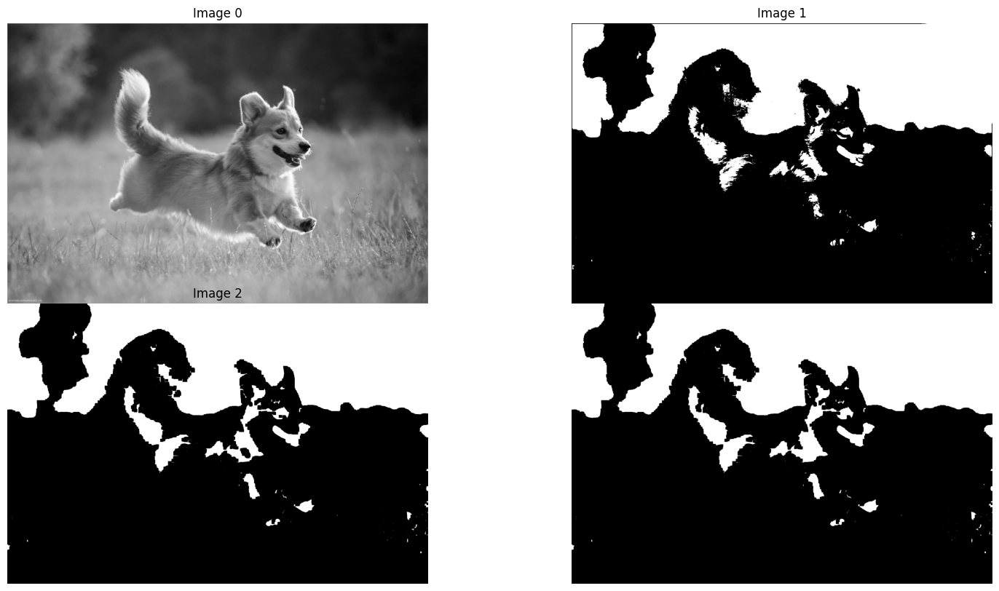

In [24]:
thresh, image_mask = cv2.threshold(image_gray,80,255,cv2.THRESH_BINARY_INV)
image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel,iterations = 3)

from scipy import ndimage as ndi
image_fill = ndi.binary_fill_holes(image_closing)

ShowImage([image_gray, image_mask, image_closing, image_fill], 2, 2)

In [25]:
from skimage.measure import label, regionprops

image_label = label(image_fill) # Label each area in the image from 1 to n
print("index of each region from 1 to ", image_label.max())

index of each region from 1 to  93


In [27]:
regions = regionprops(image_label, intensity_image=image_gray)

ColList = ["label", "at_row", "at_col", 
           "area", "minr", "minc", "maxr", "maxc", "width", "height", 
           "max_intensity", "mean_intensity", "min_intensity"]

LabelDF = pd.DataFrame(columns=ColList)

for region in regions:
    label = region.label
    at_row, at_col = region.centroid
    area = region.area
    minr, minc, maxr, maxc = region.bbox
    width = maxc - minc
    height = maxr - minr
    max_intensity = region.max_intensity
    mean_intensity = region.mean_intensity
    min_intensity = region.min_intensity

    LabelDF = pd.concat([LabelDF, pd.DataFrame({
        "label": [label],
        "at_row": [at_row],
        "at_col": [at_col],
        "area": [area],
        "minr": [minr],
        "minc": [minc],
        "maxr": [maxr],
        "maxc": [maxc],
        "width": [width],
        "height": [height],
        "max_intensity": [max_intensity],
        "mean_intensity": [mean_intensity],
        "min_intensity": [min_intensity],
    })], ignore_index=True)


In [28]:
display(LabelDF.head())

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,1,289.201816,77.850535,74325.0,0,0,558,205,205,558,116.0,61.778661,35.0
1,2,236.850318,1278.657236,704512.0,0,220,545,2048,1828,545,228.0,48.080880,8.0
2,3,155.946269,326.779104,335.0,136,316,174,339,23,38,82.0,79.540299,76.0
3,4,203.500000,723.500000,16.0,200,723,208,725,2,8,80.0,80.000000,80.0
4,5,220.902208,708.662461,317.0,208,696,232,722,26,24,85.0,79.820189,76.0


,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,1,289.201816,77.850535,74325.0,0,0,558,205,205,558,116.0,61.778661,35.0
1,2,236.850318,1278.657236,704512.0,0,220,545,2048,1828,545,228.0,48.080880,8.0
2,3,155.946269,326.779104,335.0,136,316,174,339,23,38,82.0,79.540299,76.0
4,5,220.902208,708.662461,317.0,208,696,232,722,26,24,85.0,79.820189,76.0
12,13,628.326437,1165.051351,30983.0,398,960,774,1373,413,376,137.0,71.110900,4.0
13,14,629.946154,708.844626,32927.0,399,566,826,894,328,427,124.0,73.538312,46.0
15,16,412.748538,1337.157895,171.0,406,1327,420,1350,23,14,92.0,72.263158,51.0
22,23,479.857923,1311.765027,183.0,468,1296,489,1328,32,21,118.0,88.442623,70.0
27,28,517.223214,1423.633929,112.0,509,1419,530,1432,13,21,107.0,54.741071,14.0
29,30,636.344552,1383.878709,8022.0,580,1291,697,1475,184,117,252.0,46.372600,6.0


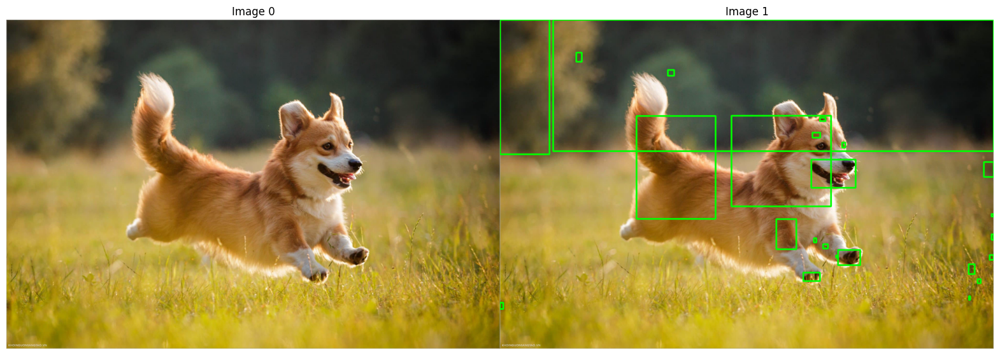

In [29]:
FindDF = LabelDF[LabelDF["area"] > 50]
display(FindDF)

result = image_color.copy()

for idx in FindDF.index:
    x = int(FindDF.loc[idx, "minc"])
    y = int(FindDF.loc[idx, "minr"])
    w = int(FindDF.loc[idx, "width"])
    h = int(FindDF.loc[idx, "height"])
    cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),5) 

ShowImage([image_color, result], 1, 2)

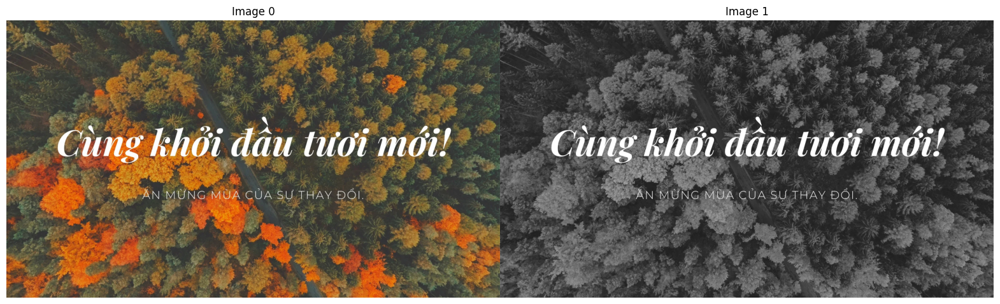

In [30]:
# Read Image 
image_color = imread("1600w-hGIvF_HcwGE.webp")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

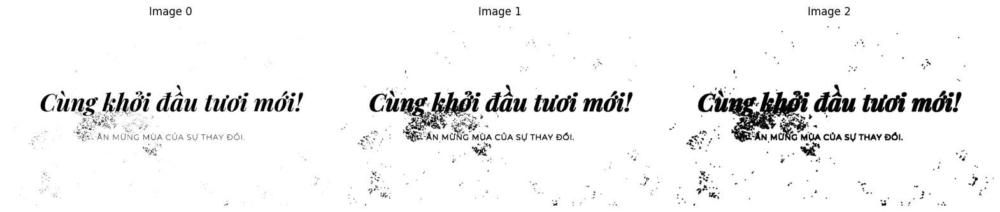

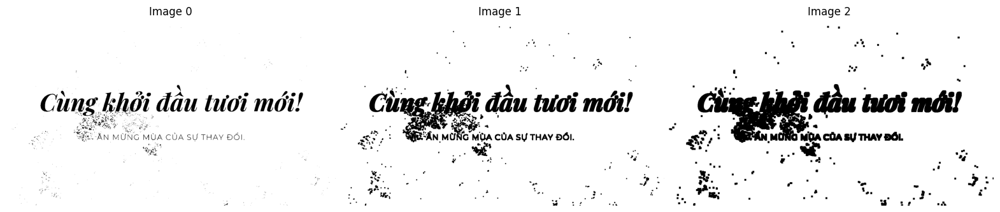

In [31]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

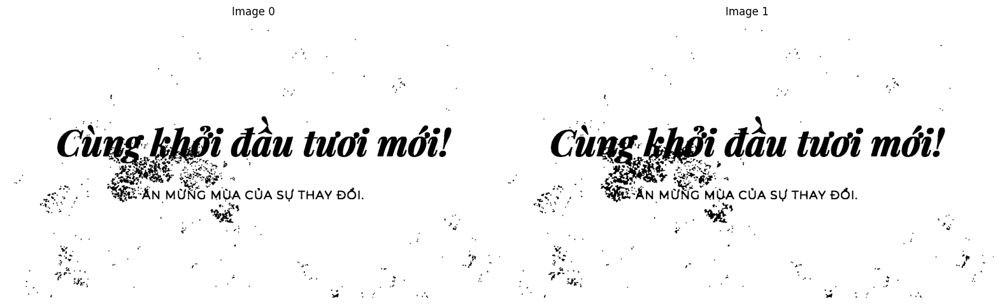

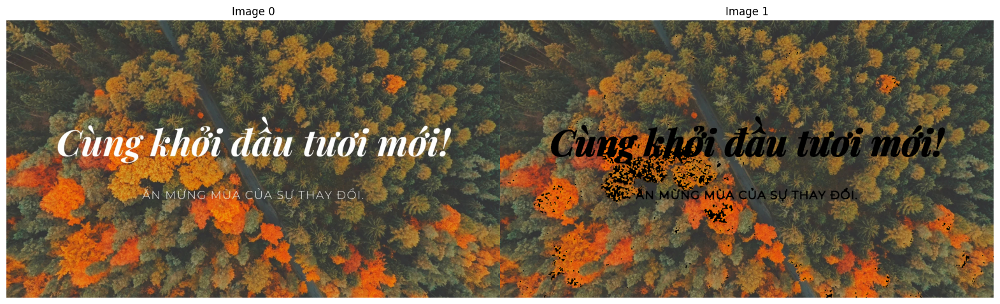

In [32]:
image_mask = image_erosion01.copy()

kernel = np.ones((3,3),np.uint8)
image_opening = cv2.morphologyEx(image_mask, cv2.MORPH_OPEN, kernel)
image_opening_color = cv2.bitwise_and(image_color, image_color, mask = image_opening)

ShowImage([image_mask, image_opening], 1, 2)
ShowImage([image_color, image_opening_color], 1, 2)

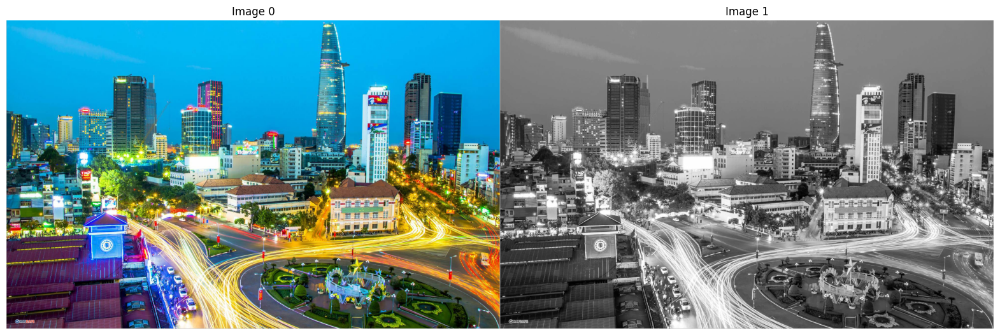

In [33]:
# Read Image 
image_color = imread("Hinh-anh-Sai-Gon-1.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

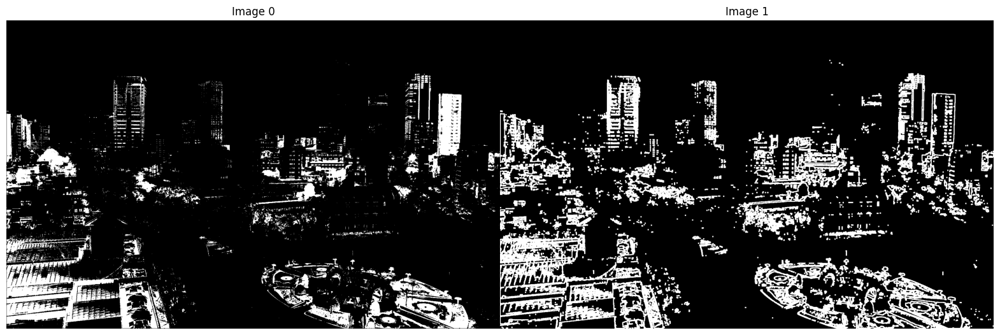

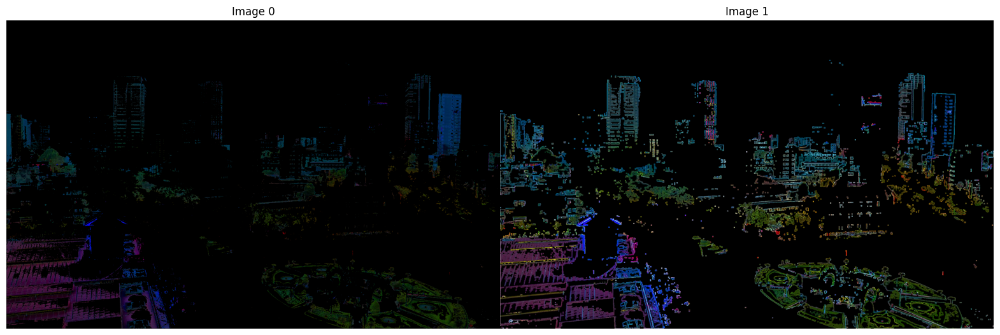

In [34]:
thresh, image_mask = cv2.threshold(image_gray,50,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((5,5),np.uint8)
image_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)

image_mask_color = cv2.bitwise_and(image_color, image_color, mask = image_mask)
image_gradient_color = cv2.bitwise_and(image_color, image_color, mask = image_gradient)

ShowImage([image_mask, image_gradient], 1, 2)
ShowImage([image_mask_color, image_gradient_color], 1, 2)

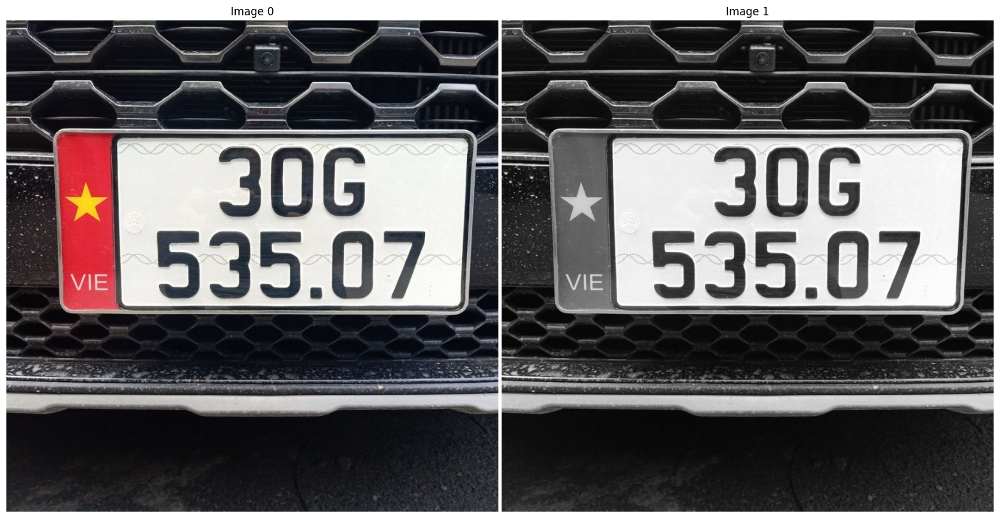

In [36]:
# Read Image 
image_color = imread("a2b56777c3630d99a3467b8d8d94f760.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

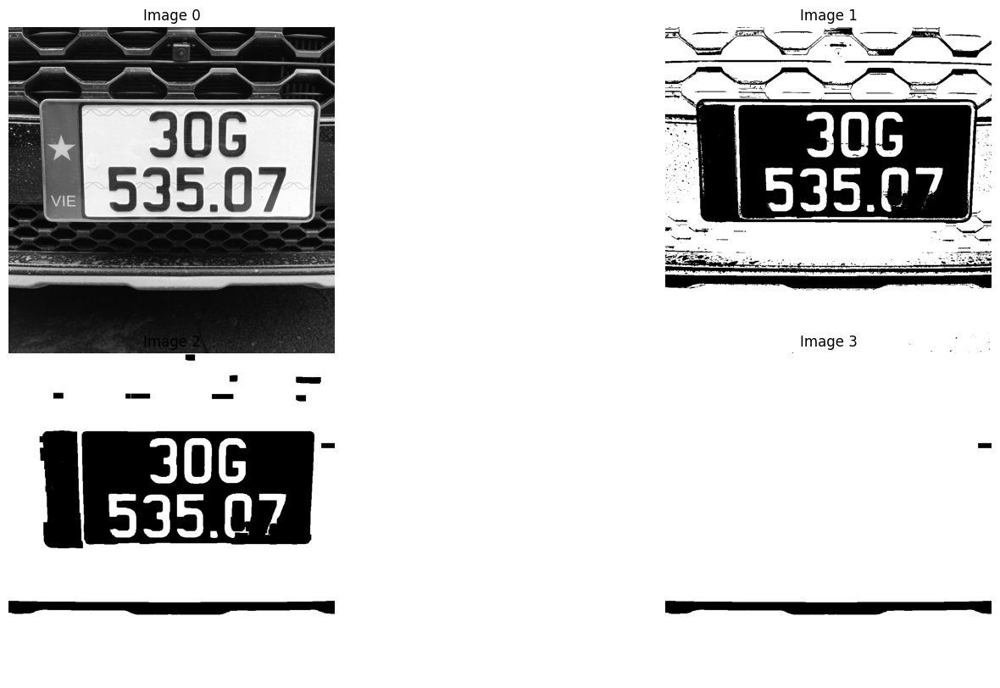

In [37]:
thresh, image_mask = cv2.threshold(image_gray,80,255,cv2.THRESH_BINARY_INV)
image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel,iterations = 3)

from scipy import ndimage as ndi
image_fill = ndi.binary_fill_holes(image_closing)

ShowImage([image_gray, image_mask, image_closing, image_fill], 2, 2)

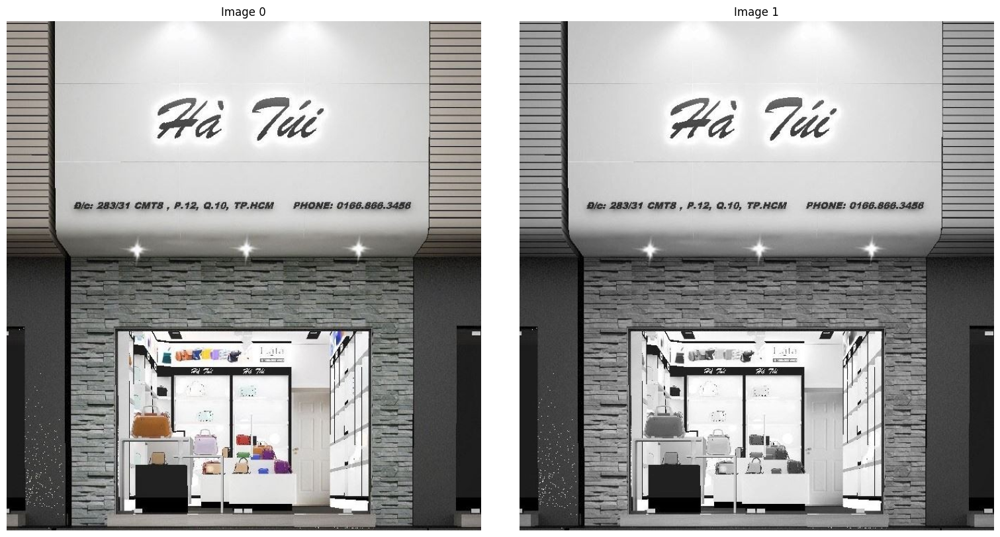

In [8]:
# Read Image 
image_color = imread("bang-hieu-shop-tui-xach-thoi-trang-1.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

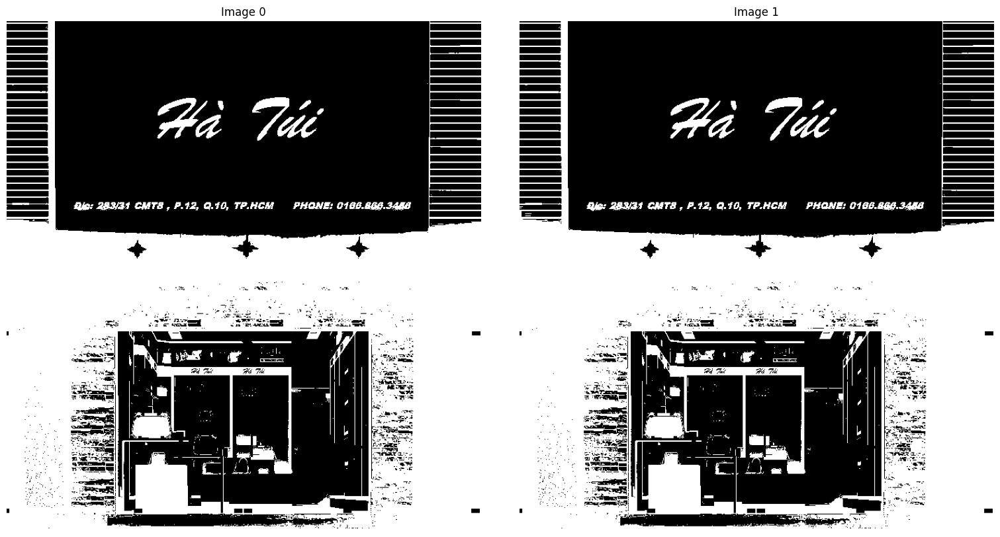

150.0


In [9]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255 # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)


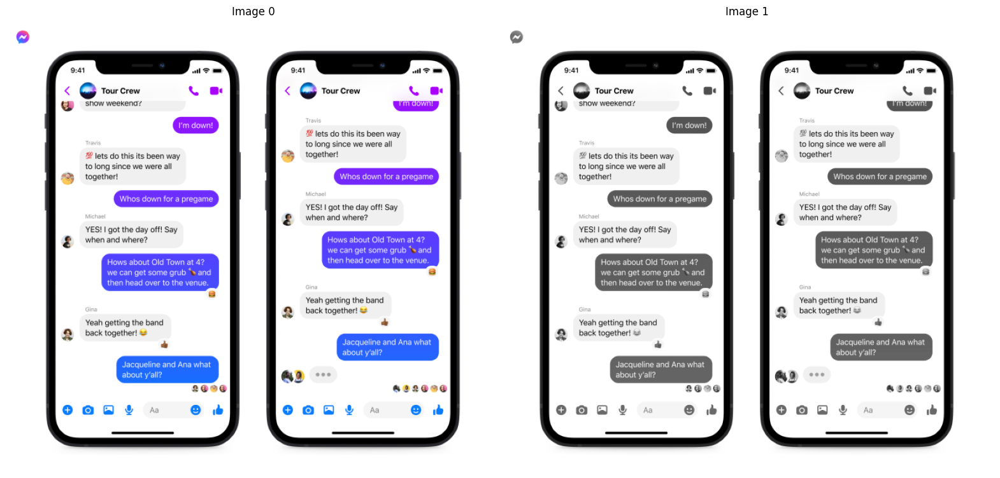

In [11]:
# Read Image 
image_color = imread("Group-Typing-Indicator-iOS.webp")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

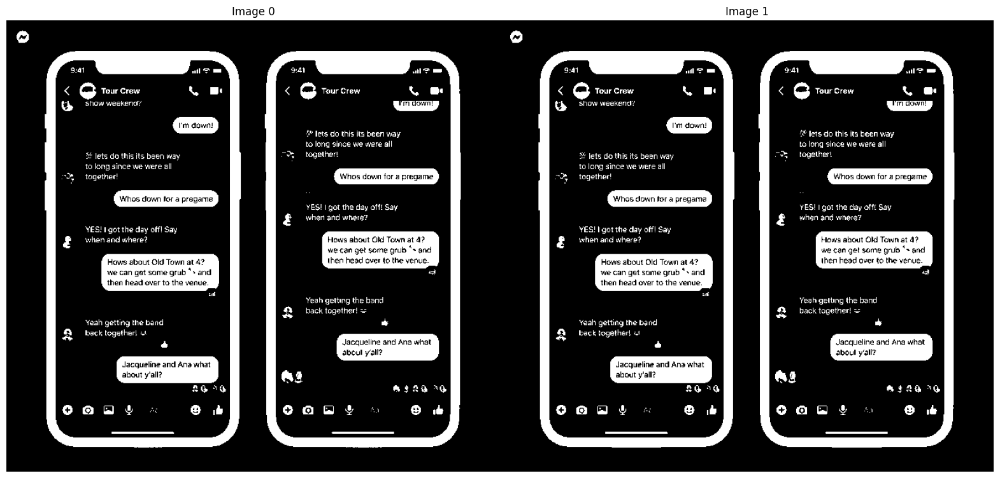

150.0


In [12]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255  # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)

[[1 1 1]
 [1 1 1]
 [1 1 1]]


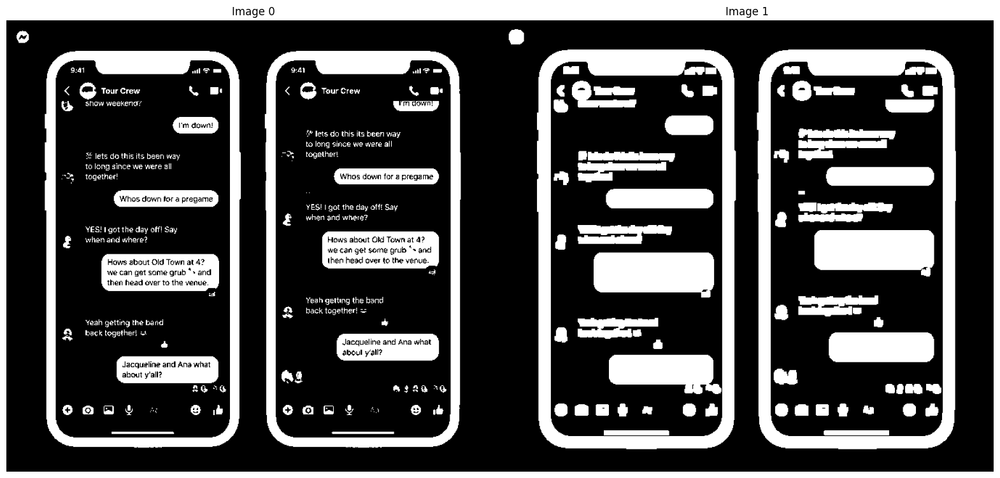

In [13]:
kernel = np.ones((3,3),np.uint8)
print(kernel)
image_dilated = cv2.dilate(image_mask01, kernel, iterations = 2)
ShowImage([image_mask01, image_dilated], 1, 2)

In [14]:
result = image_color.copy()

contours, hierarchy = cv2.findContours(image_dilated,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
count = 0
DataDF = pd.DataFrame(columns = ["x", "y", "w", "h"])
for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if(w * h > 300):
        cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),2) 
        DataDF.loc[count,:] = (x,y,w,h)
        count = count + 1
DataDF = DataDF.astype(int)

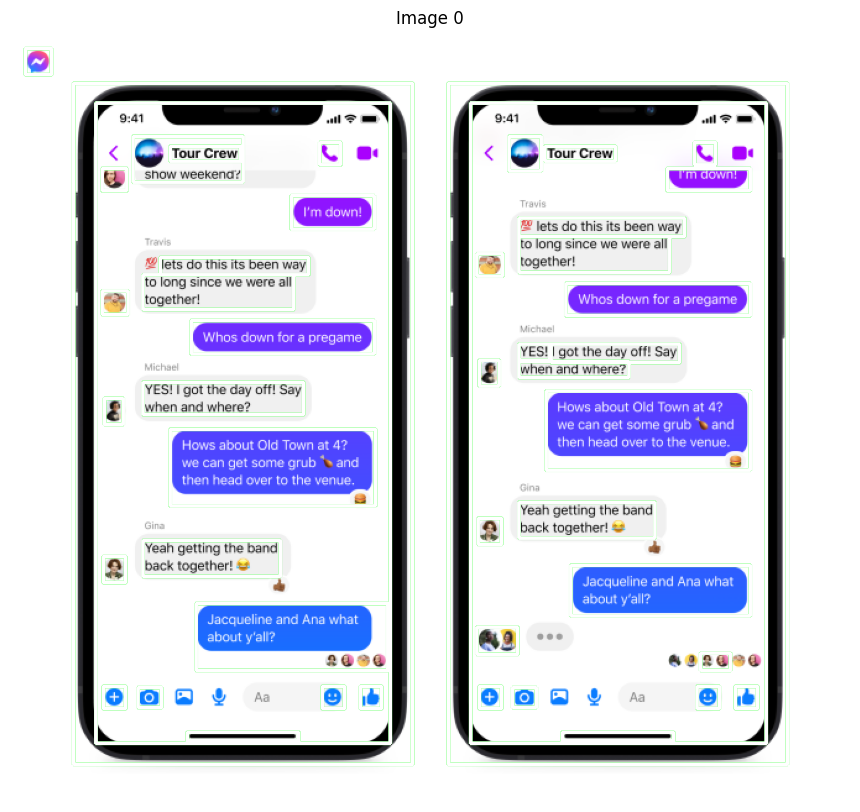

,x,y,w,h
0,354,41,274,551
1,372,57,239,518
2,446,566,90,7
3,406,530,19,16
4,586,529,18,18


In [15]:
ShowImage([result], 1, 1)
display(DataDF.head())